<a href="https://colab.research.google.com/github/agatiks/Methods-of-optimization/blob/main/lab1_GradientDescent.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Импорты, константы, функции**

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import time
import math
from math import sqrt
import sys

In [ ]:
BIG_INT = int (1E+8) #количество элементов для итераций поиска минимума
EPS = 1E-5 # внутренний эпсилон
SPACE = np.linspace(-1.5, 1.5, 30)
sin = np.vectorize(math.sin)
cos = np.vectorize(math.cos)
log = np.vectorize(math.log)
exp = np.vectorize(math.exp)

In [ ]:
def grad(func, x):
  gradient = []
  delta_x = x.copy()
  for i in range(len(x)):
    delta_x[i] = x[i] + EPS
    gradient.append((func(delta_x) - func(x))/EPS)
    delta_x[i] = x[i]
  return np.array(gradient)

In [ ]:
def rosenbroke_func(x):
  return (1 - x[0])**2 + 100 * (x[1] - x[0]**2)**2
def func2(a, b, c, d, e, f, x):
  return a*x[0]**2 + b*x[1]**2 + c*x[0]*x[1] + d*x[0] + e*x[1] + f
def func2_1(x):
  return func2(1, 1, 0, 0, 0, 0, x)
def func2_2(x):
  return func2(2, 3, 4, 2, 4, 10, x)
def func2_3(x):
  return func2(1, 1, 0, 2, 2, 20, x)


# **Графики и таблицы**

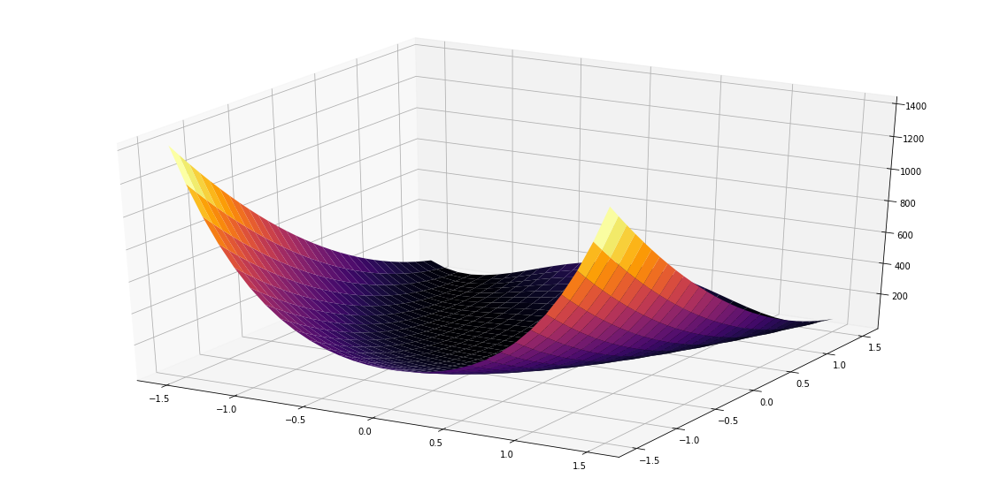

In [ ]:
def gr_3d(func, space = SPACE):
  plt.rcParams["figure.figsize"] = (20,10)
  x, y = np.meshgrid(space, space)
  v = np.array([x, y])
  ax = plt.figure().add_subplot(projection='3d')
  ax.plot_surface(x, y, func(v), cmap = "inferno")
gr_3d(rosenbroke_func)

In [ ]:
def gr_of_grad_one(func, points, work_time):
  print("Значение функции в приближённой точке экстремума: "+str(func(points[-1])))
  print ("Время: "+str(work_time))
  x_list = points.transpose()[0]
  y_list = points.transpose()[1]
  max_x = np.max(x_list)
  min_x = np.min(x_list)
  max_y = np.max(y_list)
  min_y = np.min(y_list)
  horisontal_size = max_x - min_x
  vertical_size = max_y - min_y
  space_x = np.linspace(min_x-horisontal_size/2, max_x+horisontal_size/2, int(100))
  space_y = np.linspace(min_y-vertical_size/2, max_y+vertical_size/2, int(100))
  x, y = np.meshgrid(space_x, space_y)
  v = np.array([x, y])
  res = func(v)
  minf = np.min(res)
  maxf = np.max(res)
  fig, (ax1, ax2) = plt.subplots(1, 2)
  range = np.arange(np.shape(points)[0], step = 1)
  ax1.plot(range, func(np.transpose(points)))
  ax1.grid()
  ax2.plot(points[:, 0], points[:, 1], 'o-')
  ax2.contour(x, y, func(v), levels = np.unique(sorted([func(p) for p in points] + list(np.linspace(minf, maxf, 100)))))

In [ ]:
def gr_quad_traectory(func, points, work_time):
  print("Точка экстремума: "+str(points[-1]))
  print("Количество итераций: "+str(len(points)))
  print ("Время: "+str(work_time))
  x_list = points.transpose()[0]
  y_list = points.transpose()[1]
  max_x = np.max(x_list)
  min_x = np.min(x_list)
  max_y = np.max(y_list)
  min_y = np.min(y_list)
  horisontal_size = max_x - min_x
  vertical_size = max_y - min_y
  space_x = np.linspace(min_x-horisontal_size/2, max_x+horisontal_size/2, int(100))
  space_y = np.linspace(min_y-vertical_size/2, max_y+vertical_size/2, int(100))
  x, y = np.meshgrid(space_x, space_y)

  plt.rcParams["figure.figsize"] = (20, 10)
  z = func(np.array([x, y]))
  plt.plot(points[:, 0], points[:, 1], 'o-')
  plt.contour(x, y, z, levels=sorted([(func(p)) for p in points]))
  plt.show()

# **Градиентный спуск**

In [ ]:
def constant_learning_rate_rule(c):
  return lambda x : c

In [ ]:
def grad_descent(func, learning_rate_rule = constant_learning_rate_rule(0.002),  epoch = None, learning_rate_start = 1, start = None, n = 2):
  st = time.time()
  if start is None:
    #start = np.array([0]*n)
    np.random.seed(40)
    start = np.random.rand(n)
  
  learning_rate = learning_rate_start
  i = 1
  if (epoch == None):
    points = np.zeros((BIG_INT, n))
    points[0] = start
    while(True):
      learning_rate = learning_rate_rule(learning_rate)
      points[i] = points[i - 1] - learning_rate * grad(func, points[i - 1])
      if (abs(func(points[i]) - func(points[i - 1])) < EPS):
        break
      i += 1 
  else:
    points = np.zeros((epoch, n))
    points[0] = start
    while (i < epoch):
      learning_rate = learning_rate_rule(learning_rate)
      points[i] = points[i - 1] - learning_rate * grad(func, points[i - 1])
      i += 1
  points.resize((i - 1, n))
  en = time.time()
  return points, en-st

Значение функции в приближённой точке экстремума: 0.005738214551186848
Время: 1.1664671897888184


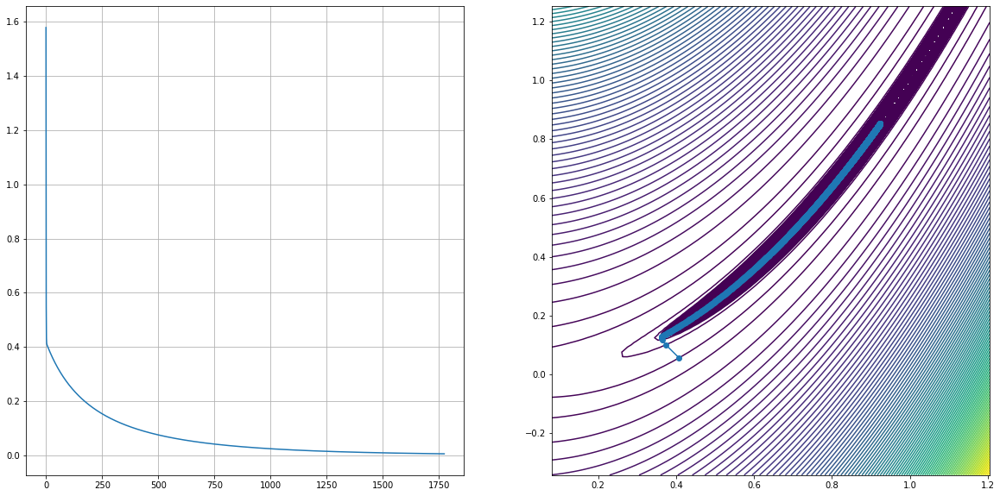

In [ ]:
points, work_time = grad_descent(rosenbroke_func)
gr_of_grad_one(rosenbroke_func, points, work_time)

In [ ]:
def analyze_const_lr(c, func = rosenbroke_func, epoch = None):
  points, work_time = grad_descent(func, learning_rate_rule=constant_learning_rate_rule(c), epoch=epoch)
  gr_of_grad_one(func, points, work_time)

Значение функции в приближённой точке экстремума: 0.024525075523705572
Время: 0.054955482482910156


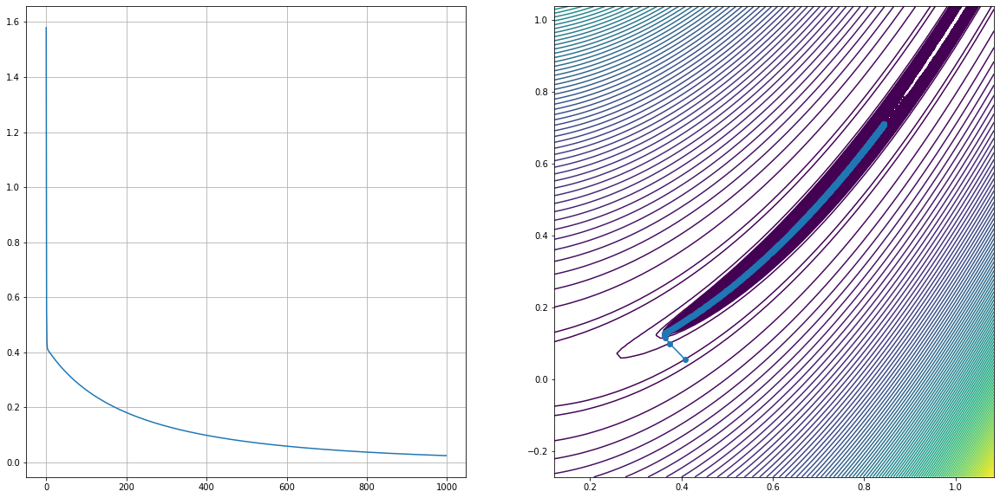

In [ ]:
analyze_const_lr(0.002, epoch = 1000)

Значение функции в приближённой точке экстремума: 0.2628377971406997
Время: 0.08132195472717285


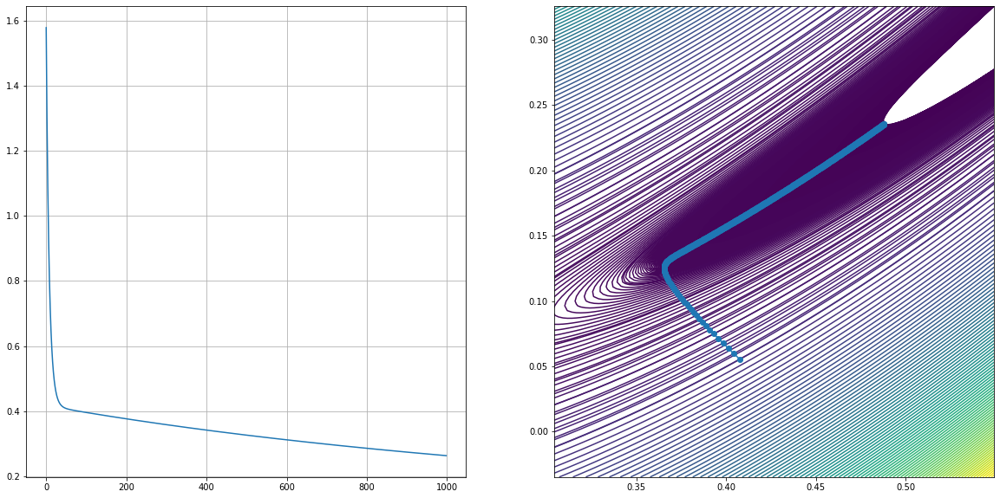

In [ ]:
analyze_const_lr(0.0002, epoch = 1000)

Значение функции в приближённой точке экстремума: 1.2811562600630606
Время: 0.03535723686218262


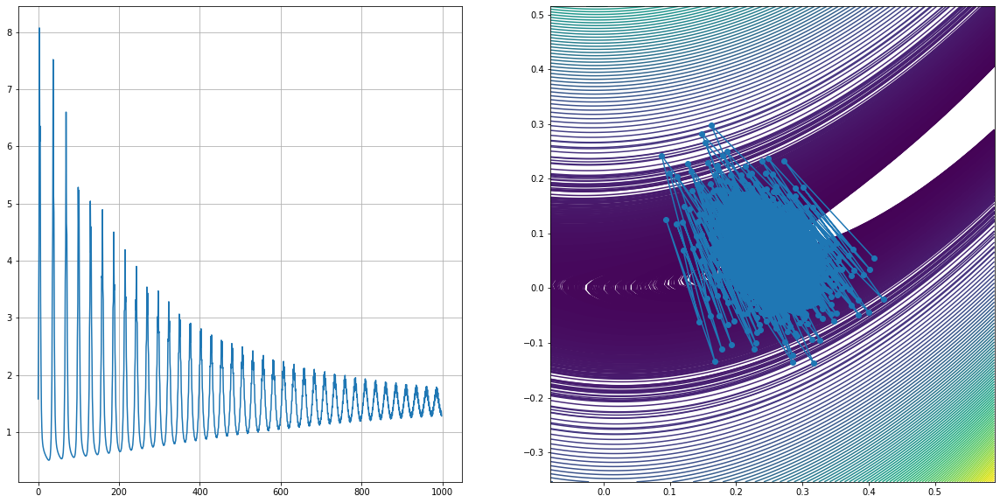

In [ ]:
analyze_const_lr(0.008, epoch = 1000)

Значение функции в приближённой точке экстремума: 0.3260245011443208
Время: 0.027356386184692383


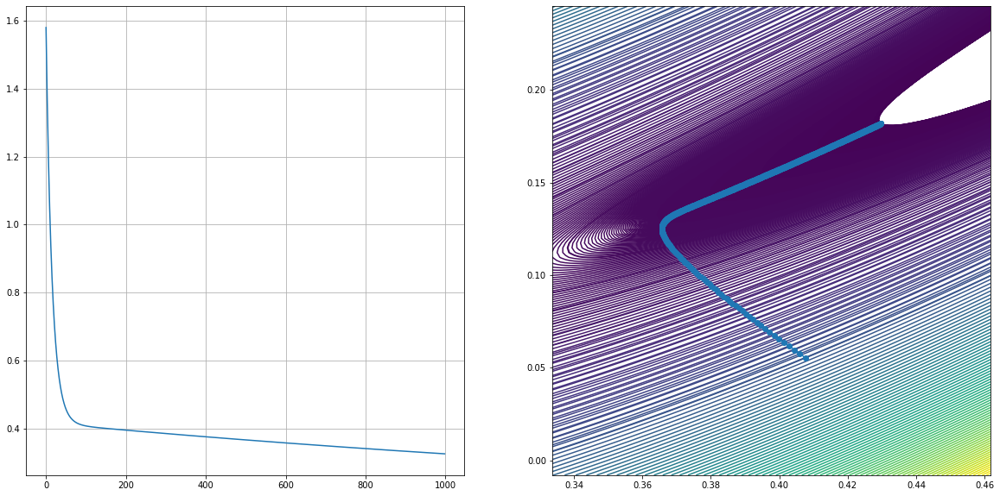

In [ ]:
analyze_const_lr(0.0001, epoch = 1000)

При приближении к искомой точке нам нужно идти более мелкими шагами, чтобы не 
пропустить нужную точку, значит константа должна быть сильно меньше растояния от точки до экстремума, но так, чтобы нам не пришлось делать слишком много шагов. Для функции из примера на паре экстремум лежит на расстоянии порядка дестых от старта. Поэтому удобнее всего брать порядка тысячных в этой ситуации. Для разных типов функций нужно подбирать наиболее эффективные константы.

# **Различные функции изменения шага (learning rate scheduling)**

In [ ]:
def exp_learning_rate_rule(coeff):
  return lambda prev: prev * (math.e ** -coeff)

In [ ]:
def analyze_exp_lr(st, coeff, func = rosenbroke_func):
  points, work_time = grad_descent(func, learning_rate_rule=exp_learning_rate_rule(coeff), learning_rate_start=st)
  gr_of_grad_one(func, points, work_time)

Значение функции в приближённой точке экстремума: 0.009321301472919027
Время: 0.4714536666870117


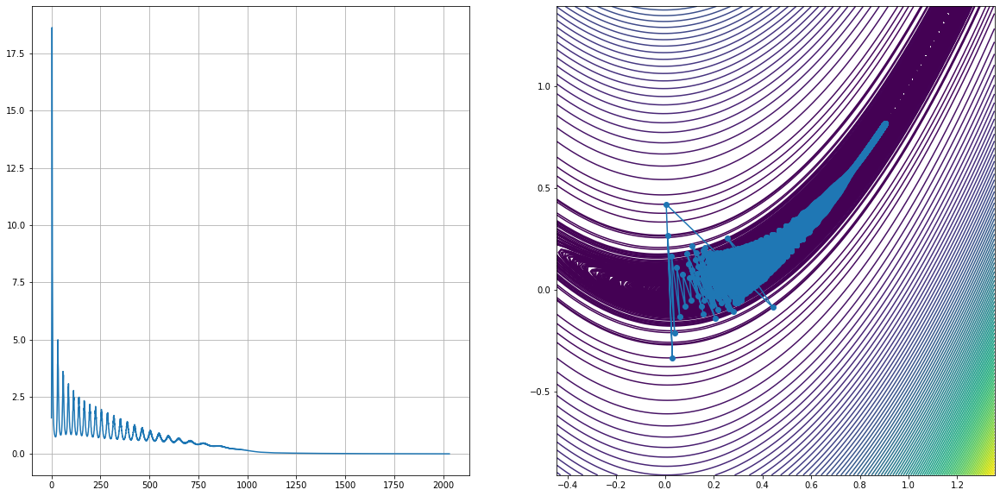

In [ ]:
analyze_exp_lr(0.009, 0.001)

Значение функции в приближённой точке экстремума: 0.5415147925938492
Время: 0.3936622142791748


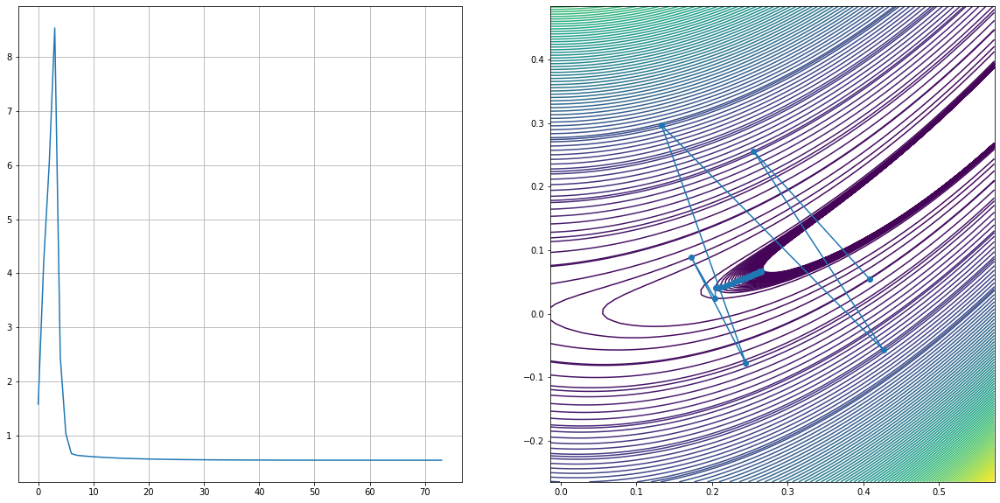

In [ ]:
analyze_exp_lr(0.01, 0.1)

Экспоненциальный спуск гораздо быстрее приходит к примерному значению, нужно гораздо меньше итераций. Но в конце шаг довольно сильно замедляется, поэтому нужно подбирать константу и точность.

# **Градиентный спуск на золотом сечении**

In [ ]:
#Одномерное золотое сечение
def golden_ratio(function, a, b, first_to_find, second_to_find, f_a, f_b):
    x1 = a + (3 - sqrt(5)) * (b - a) / 2
    x2 = a + (sqrt(5) - 1) * (b - a) / 2
    if first_to_find and second_to_find:
        f_x1 = function(x1)
        f_x2 = function(x2)
    elif first_to_find:
        f_x1 = function(x1)
        f_x2 = f_b
    elif second_to_find:
        f_x1 = f_a
        f_x2 = function(x2)
    eps_n = (b - a) / 2
    tau = (sqrt(5) - 1) / 2
    if eps_n > EPS:
        if f_x1 <= f_x2:
            b = x2
            x2 = x1
            x1 = b - tau * (b - a)
            f_x2 = f_x1
            return golden_ratio(function, a, b, 1, 0, f_x1, f_x2)
        else:
            a = x1
            x1 = x2
            f_x1 = f_x2
            x2 = b - tau * (b - a)
            return golden_ratio(function, a, b, 0, 1, f_x1, f_x2)
    else:
        x_min = (a + b) / 2
        return function(x_min)

In [ ]:
#Золотое сечение для градиентного спуска
def golden_ratio_for_descent(function, a, b, first_to_find=True, second_to_find=True, f_a=None, f_b=None):
    x1 = a + (3 - sqrt(5)) * (b - a) / 2
    x2 = a + (sqrt(5) - 1) * (b - a) / 2
    if first_to_find and second_to_find:
        f_x1 = function(x1)
        f_x2 = function(x2)
    elif first_to_find:
        f_x1 = function(x1)
        f_x2 = f_b
    elif second_to_find:
        f_x1 = f_a
        f_x2 = function(x2)
    eps_n = (b - a) / 2
    tau = (sqrt(5) - 1) / 2
    if eps_n > EPS:
        if f_x1 < f_x2:
            b = x2
            x2 = x1
            x1 = b - tau * (b - a)
            f_x2 = f_x1
            return golden_ratio_for_descent(function, a, b, 1, 0, f_x1, f_x2)
        else:
            a = x1
            x1 = x2
            f_x1 = f_x2
            x2 = b - tau * (b - a)
            return golden_ratio_for_descent(function, a, b, 0, 1, f_x1, f_x2)
    else:
        if f_x1 < f_x2:
            return x1
        else:
            return x2

In [ ]:
#learning rate golden ratio
def golden_learning_rate_rule(func, l_r):
    return golden_ratio_for_descent(func, 0, l_r)

In [ ]:
def golden_grad_descendent(func, vec = None, learning_rate_start = 0.01, epoch = None, n = 2):
    start_time = time.time()
    if vec is None:
      np.random.seed(40)
      vec = np.random.rand(n)
    i = 0
    if (epoch == None):
      points = np.zeros((BIG_INT, n))
      points[0] = vec
      while(True):
        direction = -grad(func, vec)
        def phi(a):
            return func(vec + a * direction)
        def d_phi(a):
            return grad(vec + a * direction)
        learning_rate = golden_learning_rate_rule(phi, learning_rate_start)
        vec = vec + learning_rate * direction
        points[i] = vec
        if (abs(func(points[i]) - func(points[i - 1])) < EPS):
          break;
        i += 1
    else:
      points = np.zeros((epoch, len(vec)))
      points[0] = vec
      while i < epoch:
          direction = -grad(func, vec)

          def phi(a):
              return func(vec + a * direction)

          def d_phi(a):
              return grad(func, vec + a * direction)

          learning_rate = golden_learning_rate_rule(phi, learning_rate_start)
          vec = vec + learning_rate * direction
          points[i] = vec
          i += 1
    points.resize((i, n))
    return points, time.time() - start_time

In [ ]:
def show_golden_grad_descent(func):
  print("Спуск с помощью золотого сечения")
  points, work_time = golden_grad_descendent(func)
  gr_of_grad_one(func, points, work_time)
def show_exp_grad_descent(func):
  print("Экспоненциальное правило спуска")
  analyze_exp_lr(0.009, 0.001, func = func)
def show_const_grad_descent(func):
  print("Константное правило спуска")
  analyze_const_lr(0.002, func = func)

In [ ]:
def compare(func):
  show_golden_grad_descent(func)
  show_const_grad_descent(func)
  show_const_grad_descent(func)

Спуск с помощью золотого сечения
Значение функции в приближённой точке экстремума: 0.0028216156166397475
Время: 0.46812963485717773
Константное правило спуска
Значение функции в приближённой точке экстремума: 0.005738214551186848
Время: 0.40438294410705566
Константное правило спуска
Значение функции в приближённой точке экстремума: 0.005738214551186848
Время: 0.4406886100769043


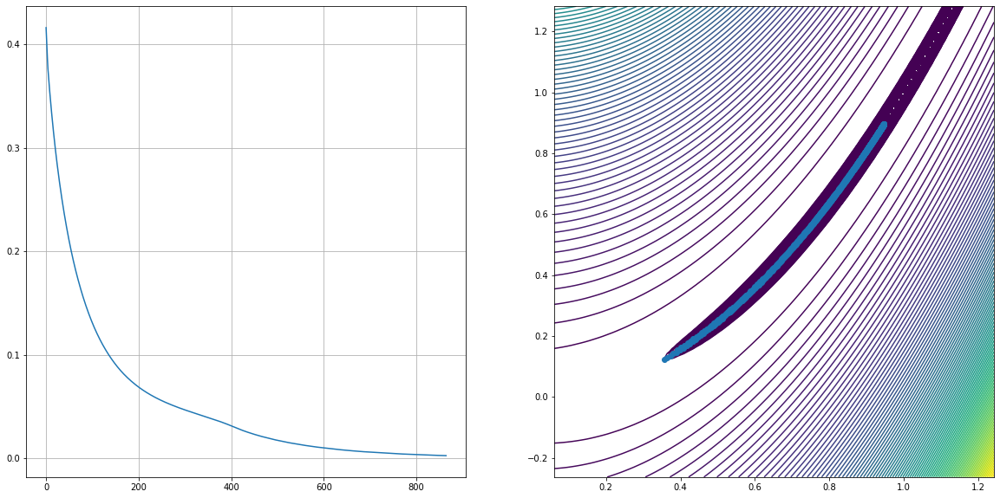

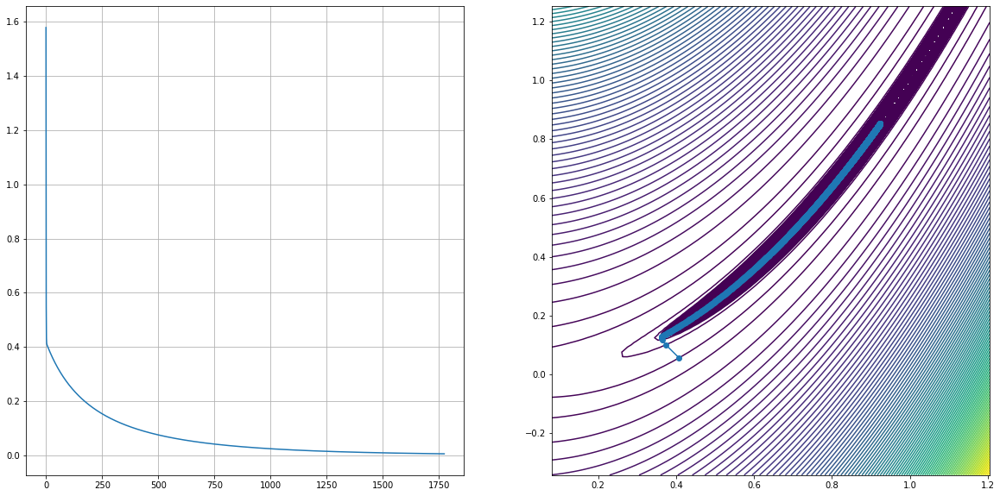

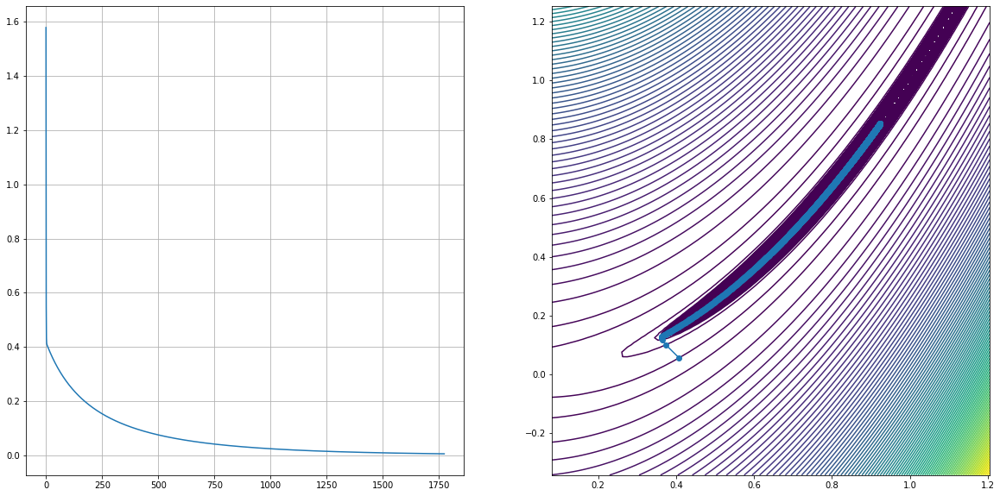

In [ ]:
compare(rosenbroke_func)

Спуск с помощью золотого сечения
Значение функции в приближённой точке экстремума: 0.0002441425731544359
Время: 0.4132258892059326
Константное правило спуска
Значение функции в приближённой точке экстремума: 0.001252837014869185
Время: 0.4014730453491211
Константное правило спуска
Значение функции в приближённой точке экстремума: 0.001252837014869185
Время: 0.4062776565551758


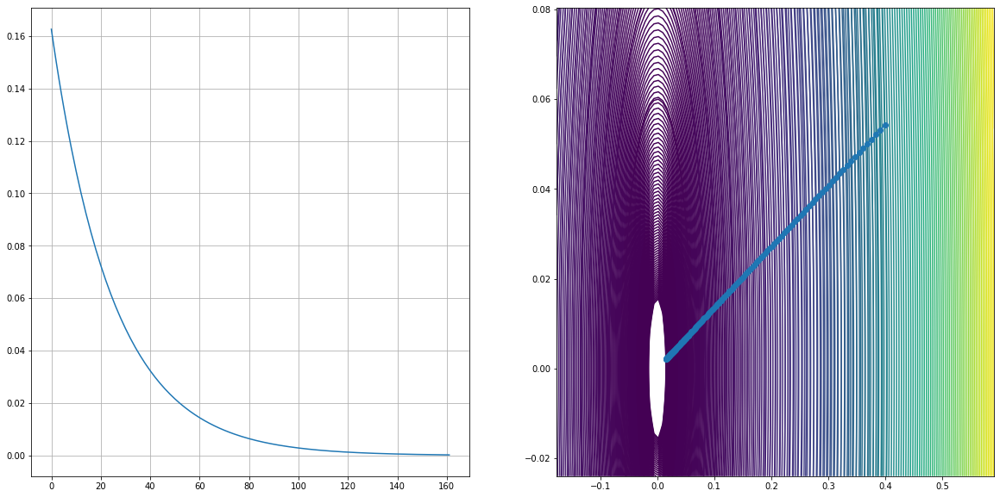

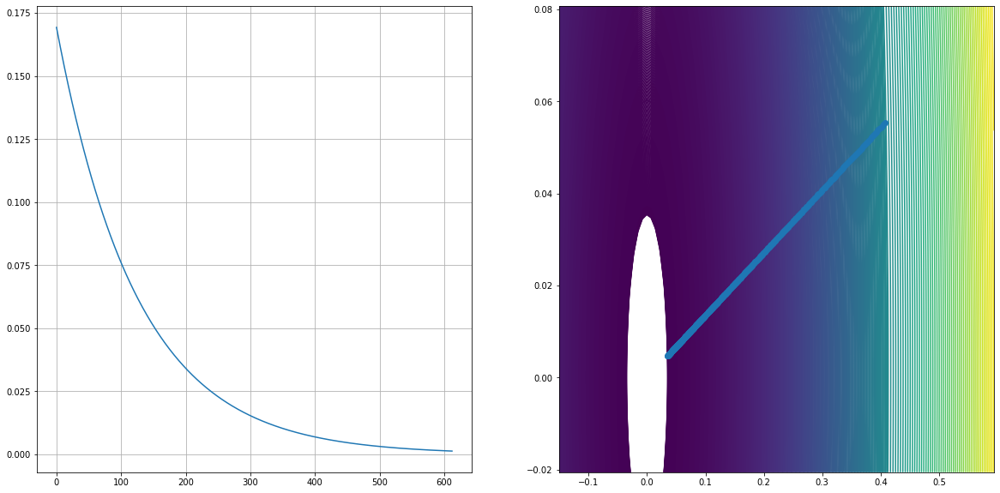

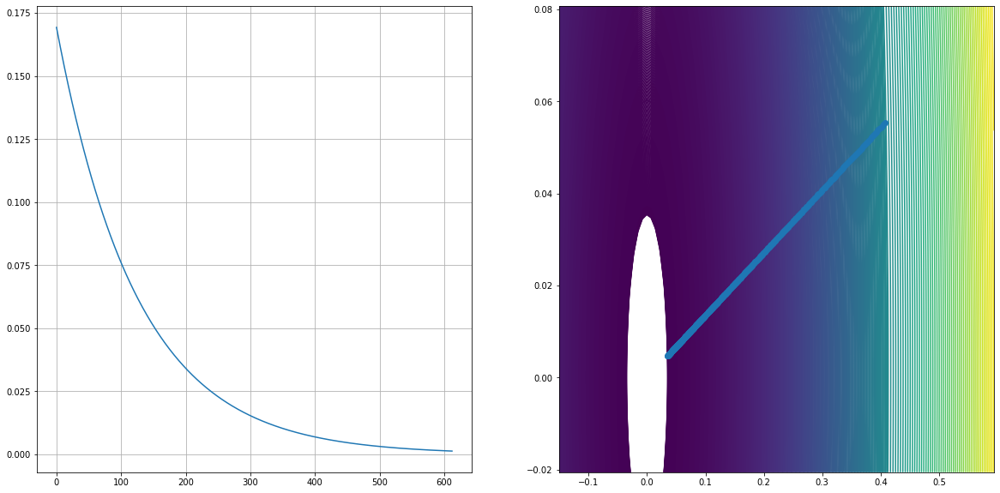

In [ ]:
compare(func2_1)

Для того,  чтобы приблизиться к точке экстремума, градиентному спуску на основе метода одномерного поиска требуется гораздо меньше итераций (160 против 600). Это мы видим по первому графику. 
В обоих случаях правило останова одинаковое - когда значение функции почти перестаёт меняться.

Градиентный спуск на основе метода золотого сечения. Метод золотого сечения корректно работает только для унимодальных функций (если говорить про рассматриваемый промежуток), поэтому мы будем работать с таковыми.

# **Одномерный поиск с учётом условий Вольфе**

In [ ]:
def wolf_cond_1(phi, l_r, d_zero, c1 = 0.000001):
  return phi(l_r) <= phi(0) + c1 * l_r * d_zero

def wolf_cond_2(phi, d_phi, direction, d_zero, lr, c2 = 0.999):
    return d_phi(lr) @ direction >= c2 * d_zero

def wolf_golden_ratio_for_descent(function, d_phi, d_zero, a, b, direction,  first_to_find=True, second_to_find=True, f_a=None, f_b=None):
    x1 = a + (3 - sqrt(5)) * (b - a) / 2
    x2 = a + (sqrt(5) - 1) * (b - a) / 2
    if first_to_find and second_to_find:
        f_x1 = function(x1)
        f_x2 = function(x2)
    elif first_to_find:
        f_x1 = function(x1)
        f_x2 = f_b
    elif second_to_find:
        f_x1 = f_a
        f_x2 = function(x2)
    eps_n = (b - a) / 2
    tau = (sqrt(5) - 1) / 2
    if eps_n > EPS and not(wolf_cond_1(function, b, d_zero) and wolf_cond_2(function, d_phi, direction, d_zero, b)):
        if f_x1 < f_x2:
            b = x2
            x2 = x1
            x1 = b - tau * (b - a)
            f_x2 = f_x1
            return wolf_golden_ratio_for_descent(function, d_phi, d_zero, a, b, direction, 1, 0, f_x1, f_x2)
        else:
            a = x1
            x1 = x2
            f_x1 = f_x2
            x2 = b - tau * (b - a)
            return wolf_golden_ratio_for_descent(function, d_phi, d_zero, a, b, direction, 0, 1, f_x1, f_x2)
    else:
        if f_x1 < f_x2:
            return x1
        else:
            return x2

def wolf_golden_grad_descendent(func, vec = None, learning_rate_start = 10, epoch=None, n = 2):
    learning_rate = learning_rate_start
    start_time = time.time()
    if vec is None:
      np.random.seed(40)
      vec = np.random.rand(n)
    i = 0
    if (epoch == None):
      points = np.zeros((BIG_INT, n))
      points[0] = vec
      while(True):
        direction = -grad(func, vec)

        def phi(a):
            return func(vec + a * direction)

        def d_phi(a):
            return grad(func, vec + a * direction)

        d_zero_phi = grad(func, np.zeros(n)) @ direction
        alph = wolf_golden_ratio_for_descent(phi, d_phi, d_zero_phi, 0, learning_rate, direction)

        vec = vec + alph * direction
        points[i] = vec
        if (abs(func(points[i]) - func(points[i - 1])) < EPS):
          break;
        i += 1
    else:
      points = np.zeros((epoch, len(vec)))
      points[0] = vec
      while i < epoch:
        direction = -grad(func, vec)

        def phi(a):
            return func(vec + a * direction)

        def d_phi(a):
            return grad(func, vec + a * direction)

        d_zero_phi = grad(func, np.zeros(len(x))) @ direction
        alph = wolf_golden_ratio_for_descent(phi, d_phi, d_zero_phi, 0, learning_rate, direction)

        vec = vec + alph * direction
        points[i] = vec
        i += 1
    points.resize((i, n))
    return points, time.time() - start_time

In [ ]:
def show_wolf_golden_grad_descent(func):
  print("Спуск с помощью золотого сечения с учётом условий Вольфе")
  points, work_time = wolf_golden_grad_descendent(func)
  gr_of_grad_one(func, points, work_time)

Спуск с помощью золотого сечения с учётом условий Вольфе
Значение функции в приближённой точке экстремума: 5.188040592997504e-05
Время: 0.5455386638641357


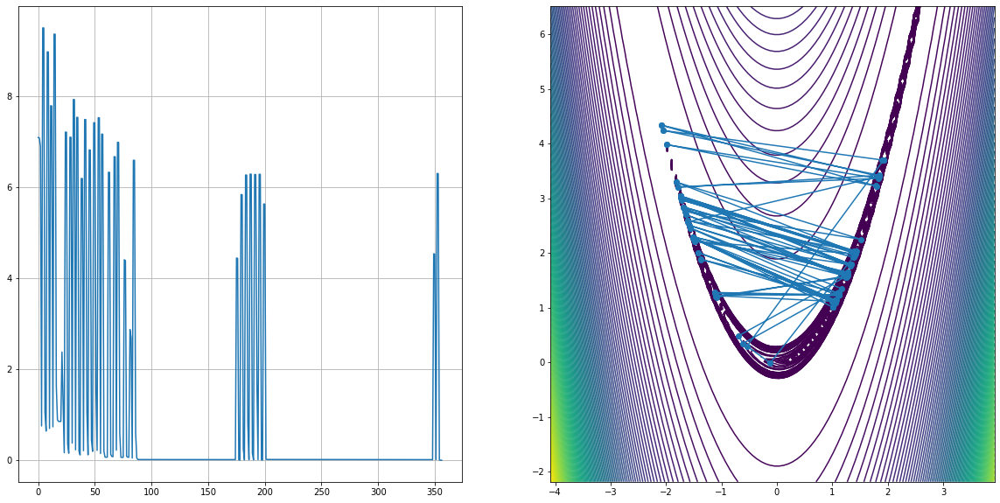

In [ ]:
show_wolf_golden_grad_descent(rosenbroke_func)

Спуск с помощью золотого сечения с учётом условий Вольфе
Значение функции в приближённой точке экстремума: 3.8969737120047326e-07
Время: 0.39473676681518555


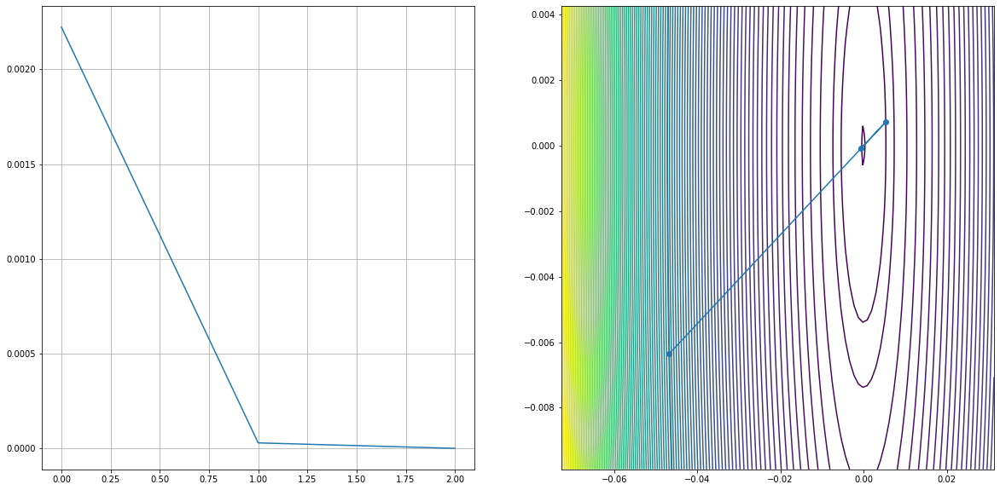

In [ ]:
show_wolf_golden_grad_descent(func2_1)

Поиск с учётом условий Вольфе сработал гораздо эффективнее. Количество итераций сильно уменьшилось.

# **Градиентный спуск для квадратичных функций**

In [ ]:
def show_quad_wolf(func, start = None):
  points, work_time = wolf_golden_grad_descendent(func, vec=start)
  gr_quad_traectory(func, points, work_time)

In [ ]:
def show_quad_golden(func, start = None):
  points, work_time = golden_grad_descendent(func, vec=start)
  gr_quad_traectory(func, points, work_time)

Точка экстремума: [0.01548349 0.00209858]
Количество итераций: 162
Время: 0.3998603820800781


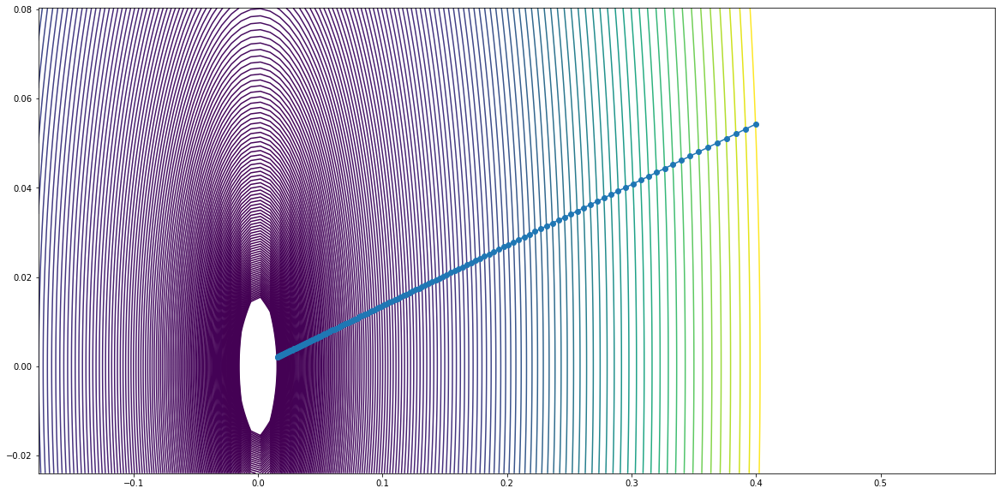

Точка экстремума: [ 0.47169075 -0.9779018 ]
Количество итераций: 341
Время: 0.4235854148864746


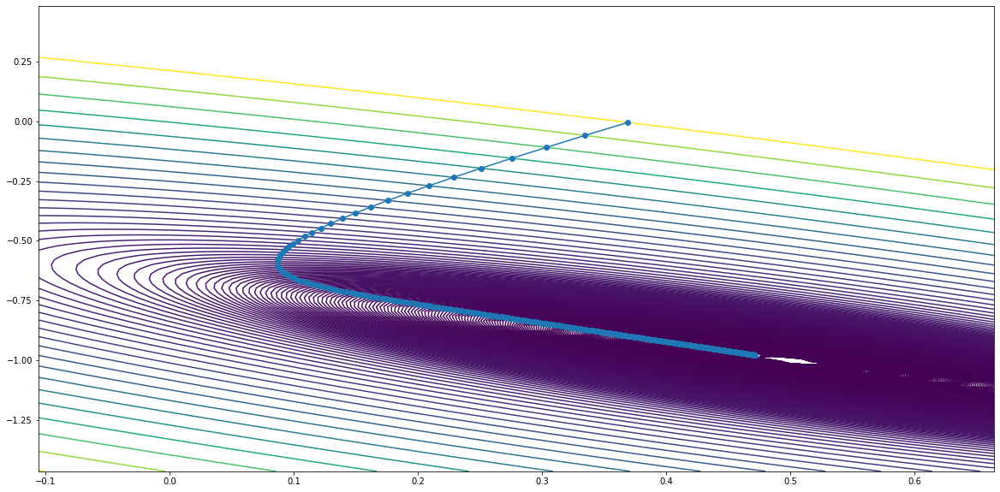

In [ ]:
show_quad_golden(func2_1)
show_quad_golden(func2_2)

У второй функции гораздо обусловленность гораздо хуже чем у второй, и как мы видим происходит гораздо больше итераций.

Точка экстремума: [-6.17987623e-04 -8.82534362e-05]
Количество итераций: 3
Время: 0.3849918842315674


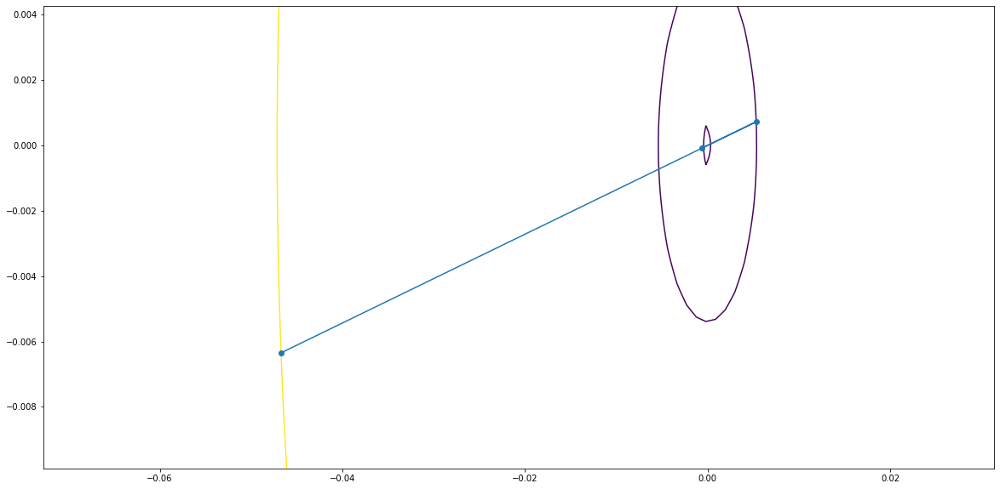

Точка экстремума: [ 0.49606147 -0.99667862]
Количество итераций: 14
Время: 0.3866736888885498


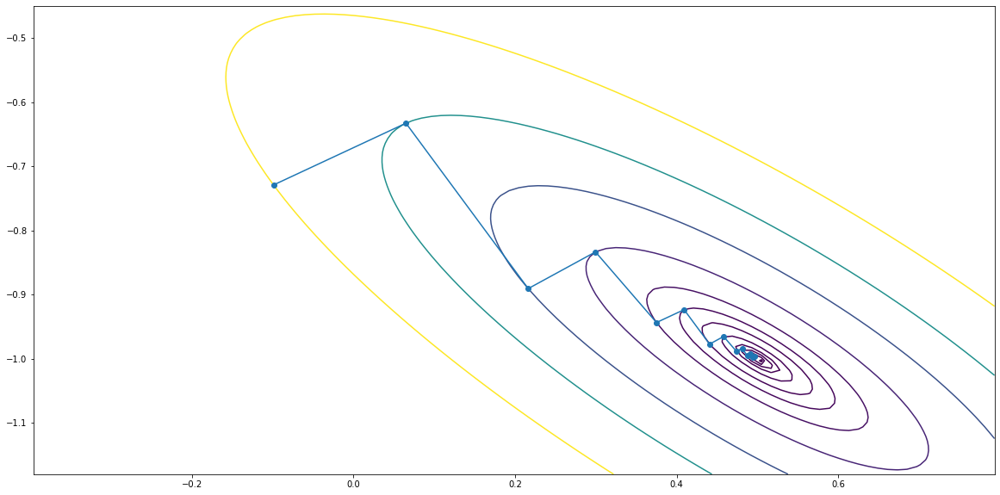

In [ ]:
show_quad_wolf(func2_1)
show_quad_wolf(func2_2)

Плохая обусловленность + неподходящий метод поиска => зигзаг и долгий поиск.

Точка экстремума: [0.01108333 0.01108333]
Количество итераций: 223
Время: 0.4063377380371094


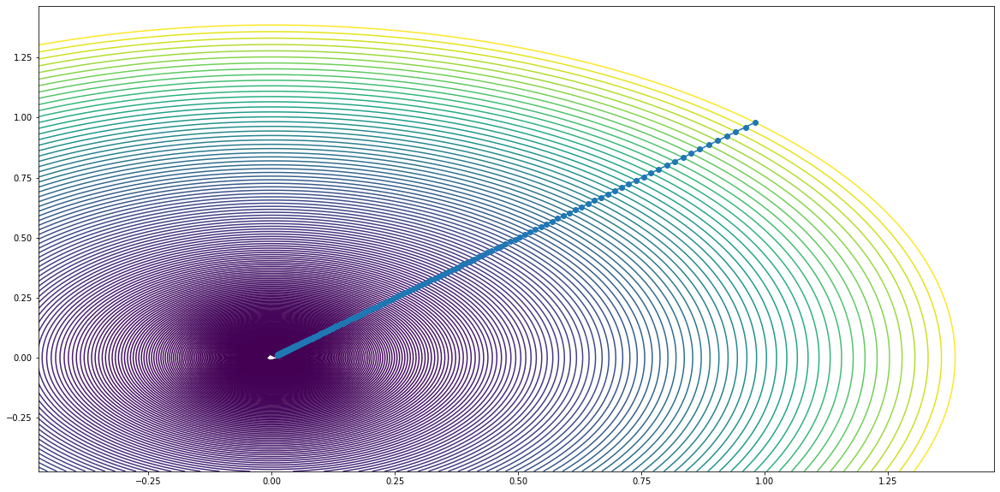

Точка экстремума: [ 0.47151166 -0.97776198]
Количество итераций: 357
Время: 0.4370605945587158


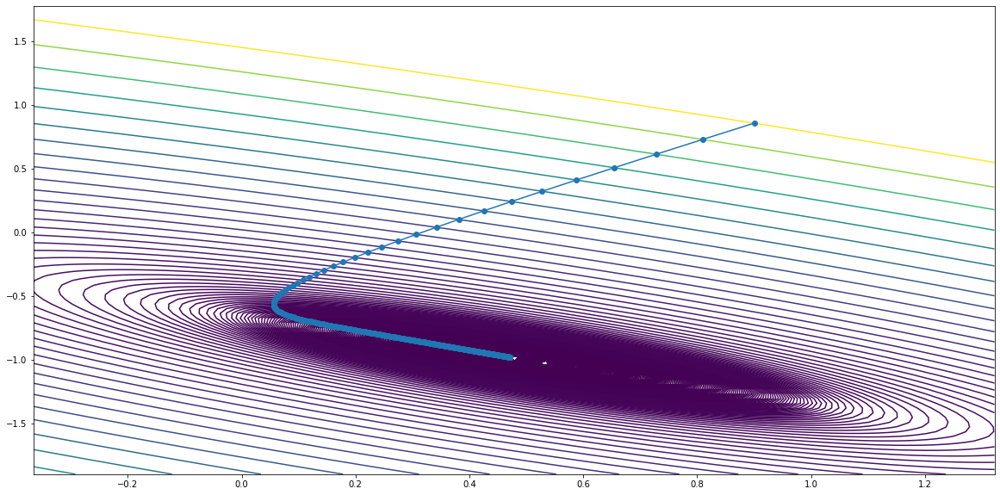

In [ ]:
show_quad_golden(func2_1, start = [1, 1])
show_quad_golden(func2_2, start = [1, 1])

Если выбрать плохо старт, то тоже может получиться зигзаг.

# **Число итераций при градиентном спуске**

In [ ]:
def generate(n, k):
  A = np.diag(np.random.rand(n)*k)#матрица n x n
  b = np.random.rand(n)#вектор из n элементов
  def func(x):
    return np.dot(np.dot(np.transpose(x), A), x)-np.dot(np.transpose(b),x)
  points, work_time = golden_grad_descent(func, n = n)
  return len(points), work_time
  

In [ ]:
generate(3, 0.1)

NameError: ignored

In [ ]:
def gr_quad_problem(iters, times):
  fig, (ax1, ax2) = plt.subplots(1, 2)
  range = np.arange(np.shape(iters)[0], step = 1)
  ax1.plot(range, iters)
  ax1.grid()
  ax2.plot(range, times)
  ax2.grid()

In [ ]:
def check_rasmer(k, finish = 15): #передаем только число обусловленности
  iters = []
  times = []
  for i in range(1, finish):
    print(str(i)+" шаг итерации")
    iter, time = generate(i, k)
    iters.append(iter)
    times.append(time)
  gr_quad_problem(np.array(iters), np.array(times))
def check_obusl(n, finish = 10): #передаем только размерность
  iters = []
  times = []
  for i in range(1, finish):
    print(str(i)+" шаг итерации")
    iter, time = generate(n, i/finish)
    iters.append(iter)
    times.append(time)
  gr_quad_problem(np.array(iters), np.array(times))


In [ ]:
check_rasmer(0.5)

In [ ]:
check_obusl(4)

Судя по небольшим данным, количество итераций увеличивается с увеличением размерности, и зависит от числа обусловленности.